In [1]:
import pyforest

In [2]:
names = ['Sequence name',
         'mcg',
         'gvh',
         'alm',
         'mit',
         'erl',
         'pox',
         'vac',
         'nuc',
         'localization']

data_yeast = pd.read_csv('/home/miguel/Documents/Git/ML/yeast.data', header = None, sep = '\s+', names = names)

data_pima = pd.read_csv('/home/miguel/Documents/Git/ML/diabetes.csv')


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

# Question 1

## Plot pair of variables

<IPython.core.display.Javascript object>

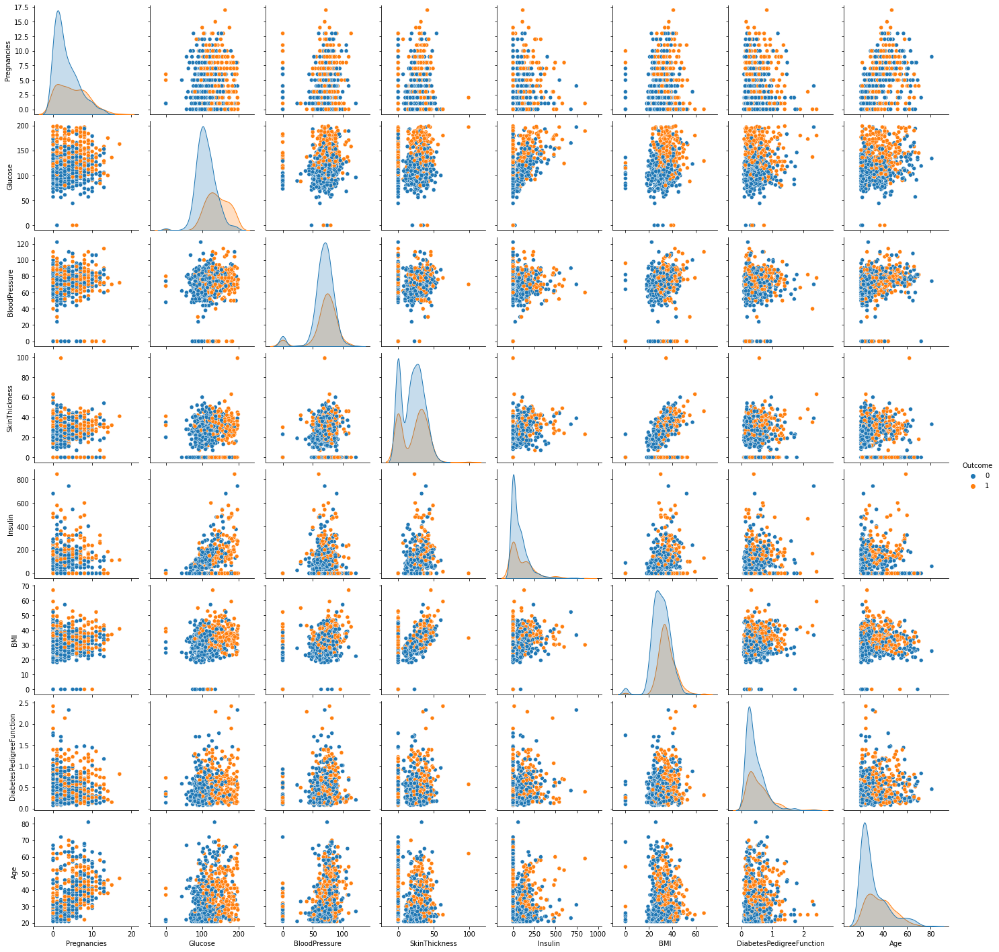

In [8]:
sns.pairplot(data_pima, hue = 'Outcome');

## Remove zeros from Glucose, Blood pressure, Skin thickness, Insulin, BMI and Diabetes

In [15]:
data_pima_clean = data_pima[(data_pima['Glucose'] != 0) & 
                            (data_pima['BloodPressure'] != 0) & 
                            (data_pima['SkinThickness'] != 0) & 
                            (data_pima['Insulin'] != 0) &
                            (data_pima['BMI'] != 0.0) & 
                            (data_pima['DiabetesPedigreeFunction'] != 0.0) ]

data_pima_clean = data_pima_clean.sample(frac=1).reset_index(drop=True)

<IPython.core.display.Javascript object>

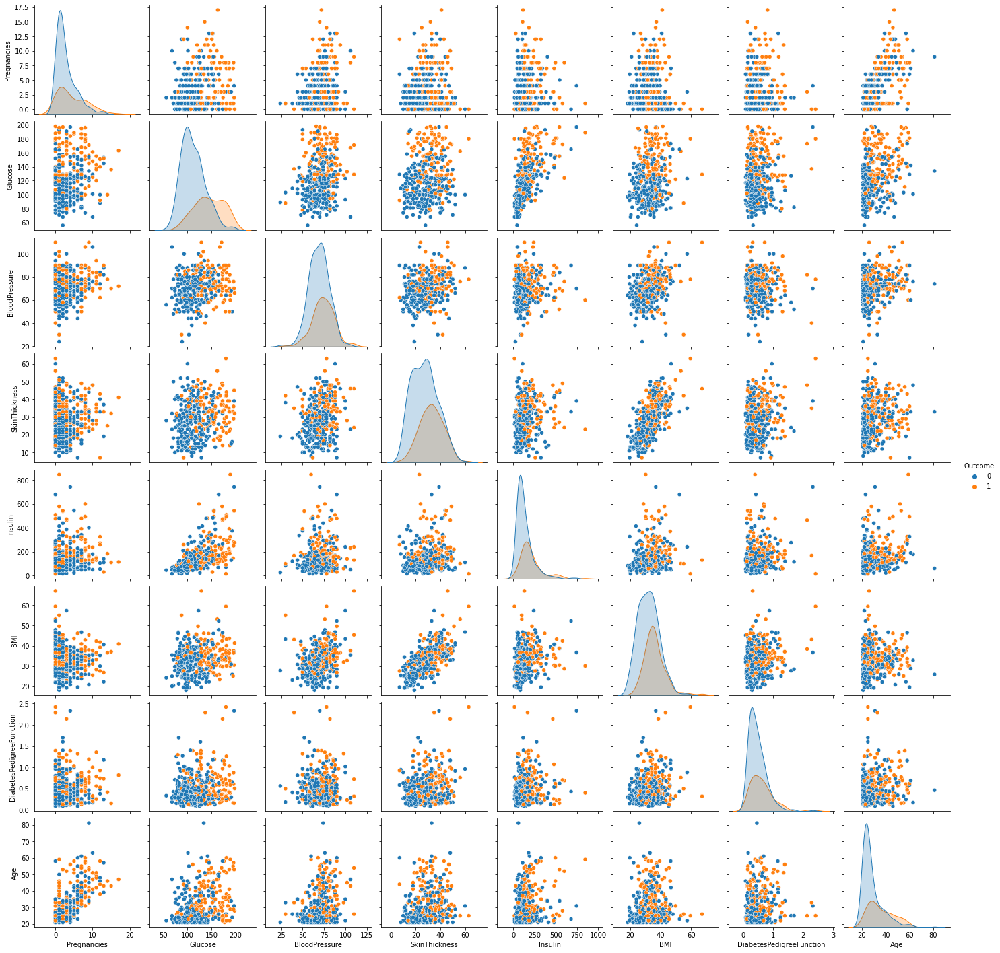

In [17]:
sns.pairplot(data_pima_clean, hue = 'Outcome');

## Feature selection

In [24]:
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import chi2
from sklearn.ensemble import ExtraTreesClassifier

In [20]:
X = data_pima_clean.drop(columns = 'Outcome')
y = data_pima_clean.loc[:,'Outcome']

### Univariate Selection

In [23]:
#apply SelectKBest class to extract top 10 best features
bestfeatures = SelectKBest(score_func=chi2, k=8)
fit = bestfeatures.fit(X,y)
dfscores = pd.DataFrame(fit.scores_)
dfcolumns = pd.DataFrame(X.columns)
#concat two dataframes for better visualization 
featureScores = pd.concat([dfcolumns,dfscores],axis=1)
featureScores.columns = ['Specs','Score']  #naming the dataframe columns
print(featureScores.nlargest(8,'Score'))  #print best features

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

                      Specs        Score
4                   Insulin  3215.172502
1                   Glucose   807.609432
7                       Age   162.221496
3             SkinThickness    97.186150
0               Pregnancies    80.412215
5                       BMI    42.585260
2             BloodPressure    32.075570
6  DiabetesPedigreeFunction     3.909884


### Feature Importance

[0.10458252 0.22009306 0.08829172 0.09884921 0.12222552 0.11532915
 0.108202   0.14242682]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

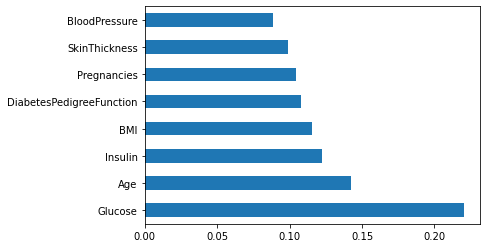

In [25]:
model = ExtraTreesClassifier()
model.fit(X,y)
print(model.feature_importances_) #use inbuilt class feature_importances of tree based classifiers
#plot graph of feature importances for better visualization
feat_importances = pd.Series(model.feature_importances_, index=X.columns)
feat_importances.nlargest(8).plot(kind='barh')
plt.show()